#### Note: This will run if you have the the movies saved as "start_numor".npz files. Check other notebook titled SANS_to_npz.ipynb for code to assist in doing this.

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from medpy.filter.smoothing import anisotropic_diffusion
from scipy.signal import argrelextrema


tensor([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11.])
tensor([0.0000, 1.0472, 2.0944, 3.1416, 4.1888, 5.2360])


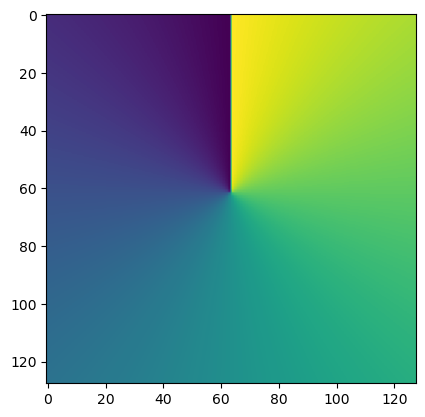

In [3]:
# Global parameters
system_symmetry = 6.
MS = torch.arange(2*system_symmetry)
ANGLES = torch.arange(0, system_symmetry) * 2 * torch.pi / system_symmetry
print(MS)
print(ANGLES)
# Extract data_theta, doesn't matter what image is extracted since we're just getting theta
DATA = np.load('/Users/cadenmyers/billingelab/dev/skyrmion_lattices/experimental_data/npz_temp_sweep/image_theta.npz')['data']

DATA_THETA = torch.atan2(torch.tensor(DATA[1]), torch.tensor(DATA[0]))
plt.imshow(DATA_THETA)

# for the model
MAX_ITER_OFFSET = 101
LR = 1e-2
OFFSET_ADJUSTMENT = 60

In [4]:
# Normalize data
def normalize_min_max(data):
    if isinstance(data, torch.Tensor):
        array = data.detach().numpy()
    else:
        array = data
    array_min = np.min(array)
    array_max = np.max(array)
    norm_array = (array - array_min) / (array_max - array_min)
    if isinstance(data, torch.Tensor):
        norm_tensor = torch.tensor(norm_array)
        return norm_tensor
    else:
        return norm_array

# Helper function to fix snapback
def adjust_offset_within_bounds(offset_list, angle_above_offset=50):
    angle_below_offset = 60 - angle_above_offset
    adjusted_offsets = []
    prev_offset = offset_list[0]
    for index, offset in enumerate(offset_list):
        if index == 0:
            adjusted_offsets.append(offset)
            prev_offset = offset
        else:
            offset_range = (prev_offset - angle_below_offset, prev_offset + angle_above_offset)
            while not (offset_range[0] <= offset <= offset_range[1]):
                offset += OFFSET_ADJUSTMENT if offset < offset_range[0] else -OFFSET_ADJUSTMENT
            adjusted_offsets.append(offset)
            prev_offset = offset
    return adjusted_offsets

In [5]:
# Import images from .npz files
# Extract data file paths
file_path = "/Users/cadenmyers/billingelab/dev/skyrmion_lattices/experimental_data/npz_sept_data/npz_field_sweep/"

# TEMP SWEEP MOVIES
# movies = ['121855.npz', '118923.npz', '119486.npz', '119996.npz', '120506.npz', '121016.npz', '121405.npz', '121550.npz', '122365.npz', '122875.npz']

# FIELD SWEEP MOVIES OLD
#movies = ['Field_29mT.npz', 'Field_31mT.npz', 'Field_32mT.npz', 'Field_33mT.npz', 'Field_37mT.npz']

#SEPT DATA
movies = ['neg23mT_553_50mW.npz', 'neg23mT_558_25mW.npz', 'neg25mT_553_50mW.npz', 'neg25mT_558_25mW.npz', 'neg27mT_553_50mW.npz', 
          'neg27mT_558_25mW.npz', 'neg29mT_553_50mW.npz', 'neg29mT_558_25mW.npz', 'neg31mT_553_50mW.npz', 'neg31mT_558_25mW.npz', 
          'neg33mT_553_50mW.npz', 'neg33mT_558_25mW.npz', 'neg35mT_553_50mW.npz', 'pos23mT_553_50mW.npz', 'pos23mT_558_25mW.npz', 
          'pos25mT_553_50mW.npz', 'pos25mT_558_25mW.npz', 'pos27mT_553_50mW.npz', 'pos27mT_558_25mW.npz', 'pos29mT_553_50mW.npz', 
          'pos29mT_558_25mW.npz', 'pos31mT_553_50mW.npz', 'pos31mT_558_25mW.npz', 'pos33mT_553_50mW.npz', 'pos33mT_558_25mW.npz']

# Define the movie you want to run GD and GS on as gif (gif = movies[i])
#movies = ['pos29mT_558_50mW.npz']
gif = movies[19]
print(gif)

movie = np.load(file_path + gif)
intensity_data = torch.tensor(movie['data'])

# Parameters:
#   iterations: Number of iterations to run the diffusion process.
#   kappa: Threshold for edge stopping (higher means less edge detection).
#   gamma: Step size (controls diffusion speed).
niter=50
kappa=30
gamma=.1
# intensity_data = torch.tensor(anisotropic_diffusion(intensity_data, niter=niter, kappa=kappa, gamma=gamma))

print('Tensor shape should be (X,128,128), where X is the number of images.')
print(intensity_data.shape)

pos29mT_553_50mW.npz
Tensor shape should be (X,128,128), where X is the number of images.
torch.Size([299, 128, 128])


In [6]:

# field sweep, pos29mT_553_50mW.npz
offset1 = torch.tensor(0., requires_grad=True)
offset2 = torch.tensor(0., requires_grad=True)
k = 5
def gradient_descent_optimize_offset(intensity, offset1, offset2, k=k):
    # Step 1.1: Discrete search for number of domains and get approximate offset positions
    # (best if can replace this as continuous.. then no gradient descent is needed)
    prev_offset1 = offset1.detach().numpy()
    prev_offset2 = offset2.detach().numpy()
    offset_range = np.arange(prev_offset1, prev_offset1+np.pi/2, 1/180*np.pi) # search over 90 deg. of offsets to avoid periodic cutoff
    loss_list = []
    for offset in offset_range:
        evaluate_image_theta = torch.exp(k * torch.log((torch.sin(3 * (DATA_THETA + offset)))**2))
        loss = -(intensity * evaluate_image_theta).sum()
        loss_list.append(loss.item())

    offset_range = np.rad2deg(offset_range)
    # Visualize loss function vs. offsets, first derivatives, and second derivatives
    # fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    # axes[0].plot(offset_range, loss_list)
    # axes[0].set_title('Loss vs. offsets')
    # axes[0].axhline(0, color='red')
    # axes[1].plot(offset_range, np.gradient(loss_list))
    # axes[1].set_title('First Derivative')
    # axes[1].axhline(0, color='red')
    # axes[2].plot(offset_range, np.gradient(np.gradient(loss_list)))
    # axes[2].set_title('Second Derivative')
    # axes[2].axhline(0, color='red')
    # plt.show()
    
    # Step 1.2: Get approximate offset positions through finding the points of inflexion
    # by finding the largest one/two local maxima in second derivatives
    first_derivative = np.gradient(loss_list)
    second_derivative = np.gradient(np.gradient(loss_list))
    local_maxima_indices = argrelextrema(second_derivative, np.greater)[0]                     # find local maxima
    local_maxima_indices = [idx for idx in local_maxima_indices if second_derivative[idx] > 0] # remove local maxima
    local_maxima_indices = [index for index in local_maxima_indices if 15 <= index <= 75]      # pick middle offsets to avoid edge cutoff
    maxima_values = [(index, offset_range[index], second_derivative[index]) for index in local_maxima_indices]
    # Remove repetitive maxima values (+/- 60 deg. or pi/3 rad)
    filtered_maxima = maxima_values.copy()
    for i in range(len(maxima_values)):
        for j in range(i+1, len(maxima_values)):
            if abs(maxima_values[j][1] - maxima_values[i][1] - np.pi/3) <= 1e-4:
                filtered_maxima.remove(maxima_values[j])    
    # Sort the remaining maxima based on the second derivative values in descending order
    sorted_filtered_maxima = sorted(filtered_maxima, key=lambda x: x[2], reverse=True)
    if len(sorted_filtered_maxima) > 1:
        largest_two = sorted_filtered_maxima[:2]
    else:
        largest_two = sorted_filtered_maxima[:1]  # Only one element available
    largest_values = [value for _, value, _ in largest_two]
    number = len(largest_two)
    print("Number of domains = ", number, ", Offset values are approx. ", largest_values)

    # Step 2: First Gradient Descent to find the global maximum (probably local?)
    opt = torch.optim.Adam([offset1], lr=LR)
    for i in range(MAX_ITER_OFFSET):
        evaluate_image_theta = torch.exp(k * torch.log((torch.sin(3 * (DATA_THETA + offset1)))**2))
        loss = -(intensity * evaluate_image_theta).sum()
        opt.zero_grad()
        loss.backward()
        opt.step()
    first_offset = offset1.clone().detach()
    final_first_offset_value = first_offset.item()
    
    # Step 3: Second Gradient Descent
    if number == 1:
        current_offset = final_first_offset_value
        offset_range = (prev_offset2 - np.pi/3, prev_offset2 + np.pi/3)
        # while not (offset_range[0] <= current_offset <= offset_range[1]):
        #     current_offset += np.pi/3 if current_offset < offset_range[0] else -np.pi/3
        offset_second = torch.tensor(final_first_offset_value, requires_grad=True)
        evaluate_image_theta_second = evaluate_image_theta
        loss_second = loss
    else:
        # Get approximate offset value for second offset
        offset_range = (final_first_offset_value - np.pi/6, final_first_offset_value + np.pi/6 + 0.1)
        # Edit the values (+- 60 deg.) so that we know which is the first offset
        largest_values_edited = [
            large + (np.pi/3 if large < offset_range[0] else -np.pi/3) * 
            int(not (offset_range[0] <= large <= offset_range[1]))
            for large in largest_values
        ]
        # Calculate the differences to determine the second offset
        offset_second = torch.tensor(
            max(largest_values_edited, key=lambda x: abs(x - final_first_offset_value)), 
            requires_grad=True
        )
        # Get second offset through Gradient Descent
        opt_second = torch.optim.Adam([offset_second], lr=LR)
        for i in range(5): # make sure it's trapped around the second offset and does not go over to the first offset
            evaluate_image_theta_second = torch.exp(k * torch.log((torch.sin(3 * (DATA_THETA + offset_second)))**2))
            loss_second = -(intensity * evaluate_image_theta_second).sum()
            opt.zero_grad()
            loss_second.backward()
            opt.step()

    return first_offset, evaluate_image_theta, loss, offset_second, evaluate_image_theta_second, loss_second




In [21]:
mon_5 = np.load('/Users/cadenmyers/billingelab/dev/skyrmion_lattices/experimental_data/npz_sept_data/npz_field_sweep/mon_5/pos29mT_553_50mW.npz')['monitor_5_count']
print(mon_5.shape)
mon_1 = np.load('/Users/cadenmyers/billingelab/dev/skyrmion_lattices/experimental_data/npz_sept_data/npz_field_sweep/mon_1/pos29mT_553_50mW.npz')['monitor_1_count']
print(mon_1.shape)
# plt.imshow(intensity_data[0] / mon_5[0])
# plt.colorbar()

(299,)
(299,)


Number of domains =  1 , Offset values are approx.  [2796.4379445728578]
0.0
10 s
offset 1: 48.801353454589844
offset 2: 48.801353454589844
tensor(-0.0664, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0664, dtype=torch.float64, grad_fn=<NegBackward0>)


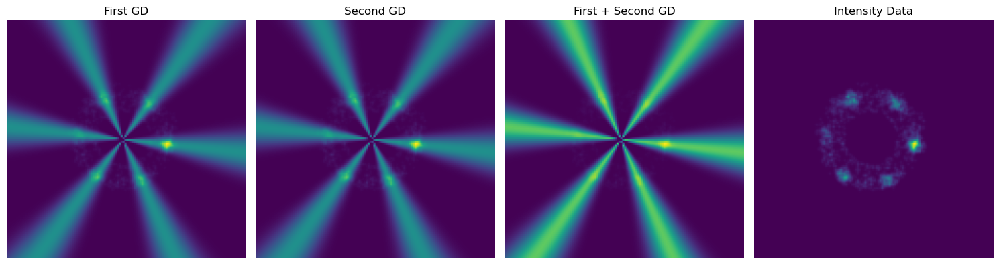

------------------------
Number of domains =  2 , Offset values are approx.  [2861.111587474187, 2827.111587474182]
0.04483829750804185
20 s
offset 1: 48.891380310058594
offset 2: 2860.064389922991
tensor(-0.0636, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0188, dtype=torch.float64, grad_fn=<NegBackward0>)


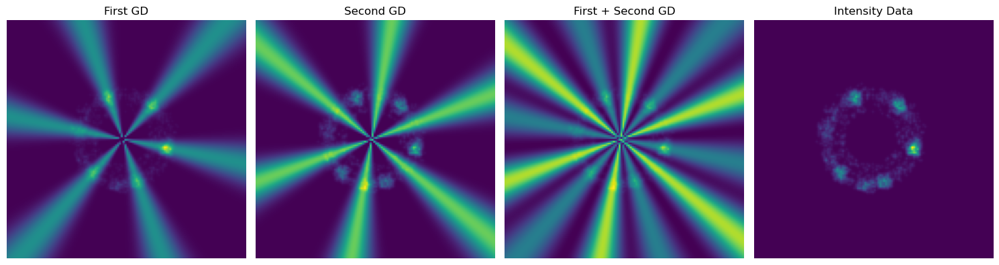

------------------------
Number of domains =  1 , Offset values are approx.  [2866.2697463353807]
0.0
30 s
offset 1: 48.995941162109375
offset 2: 48.995941162109375
tensor(-0.0578, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0578, dtype=torch.float64, grad_fn=<NegBackward0>)


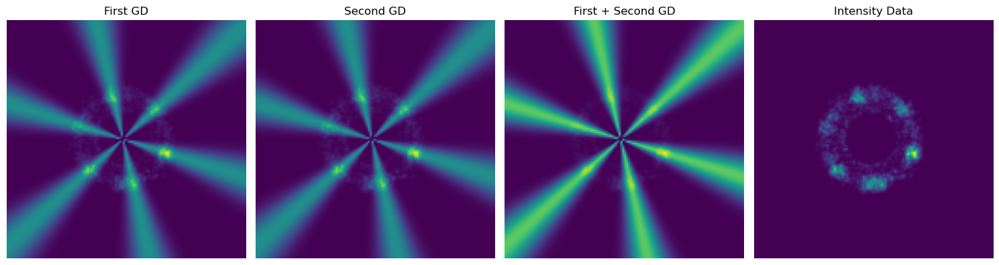

------------------------
Number of domains =  1 , Offset values are approx.  [2872.260641860182]
0.0
40 s
offset 1: 49.117733001708984
offset 2: 49.117733001708984
tensor(-0.0568, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0568, dtype=torch.float64, grad_fn=<NegBackward0>)


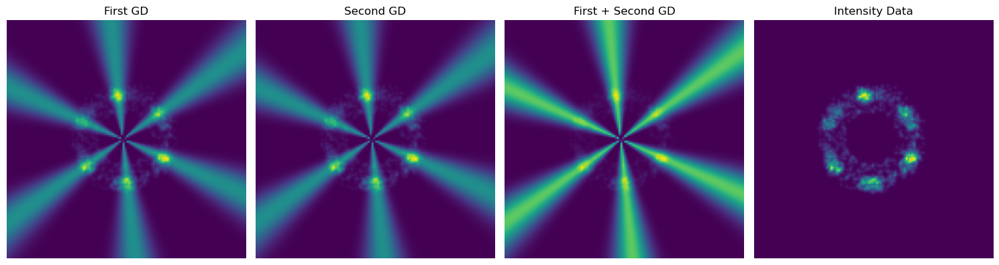

------------------------
Number of domains =  1 , Offset values are approx.  [2881.2388002483744]
0.0
50 s
offset 1: 49.26628112792969
offset 2: 49.26628112792969
tensor(-0.0564, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0564, dtype=torch.float64, grad_fn=<NegBackward0>)


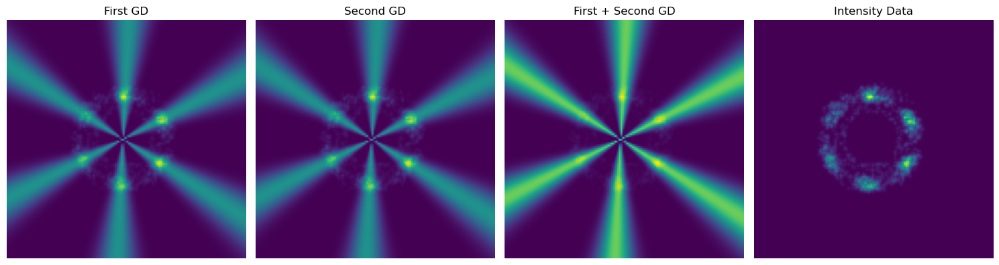

------------------------
Number of domains =  1 , Offset values are approx.  [2894.749980935398]
0.0
60 s
offset 1: 49.45695114135742
offset 2: 49.45695114135742
tensor(-0.0663, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0663, dtype=torch.float64, grad_fn=<NegBackward0>)


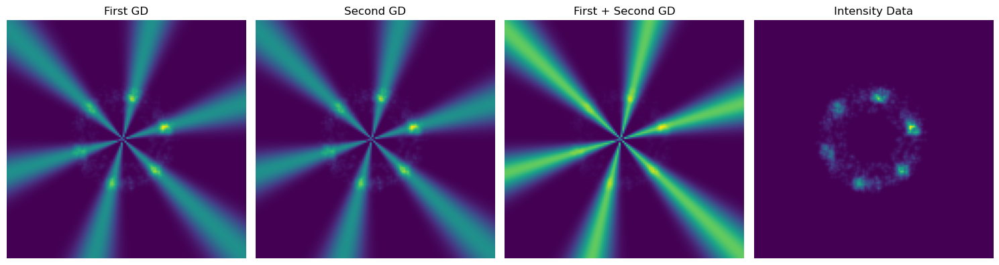

------------------------
Number of domains =  1 , Offset values are approx.  [2898.674567984509]
0.0
70 s
offset 1: 49.539268493652344
offset 2: 49.539268493652344
tensor(-0.0763, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0763, dtype=torch.float64, grad_fn=<NegBackward0>)


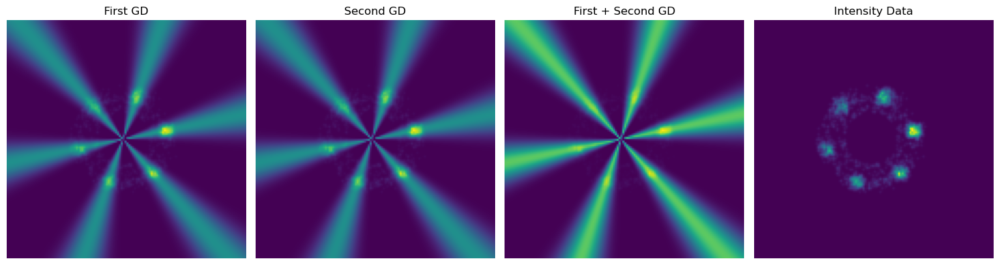

------------------------
Number of domains =  1 , Offset values are approx.  [2899.391004851699]
0.0
80 s
offset 1: 49.56892776489258
offset 2: 49.56892776489258
tensor(-0.0695, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0695, dtype=torch.float64, grad_fn=<NegBackward0>)


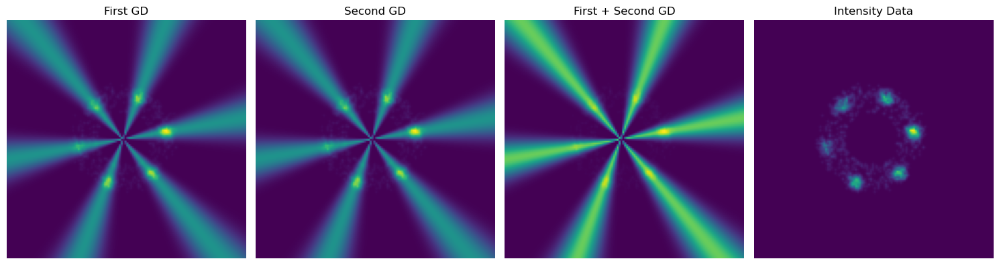

------------------------
Number of domains =  1 , Offset values are approx.  [2904.090355917199]
0.0
90 s
offset 1: 49.638702392578125
offset 2: 49.638702392578125
tensor(-0.0682, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0682, dtype=torch.float64, grad_fn=<NegBackward0>)


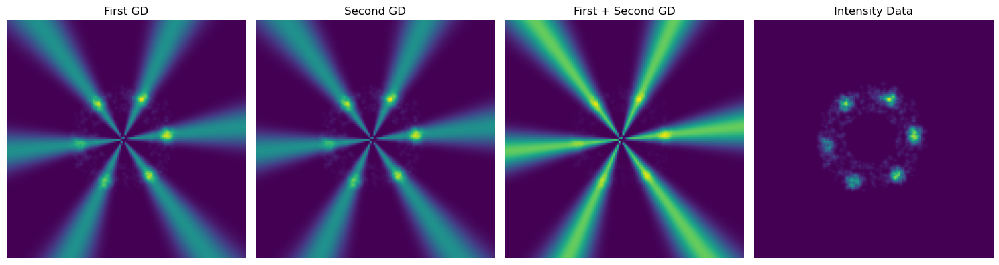

------------------------
Number of domains =  1 , Offset values are approx.  [2906.088147600677]
0.0
100 s
offset 1: 49.671592712402344
offset 2: 49.671592712402344
tensor(-0.0663, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0663, dtype=torch.float64, grad_fn=<NegBackward0>)


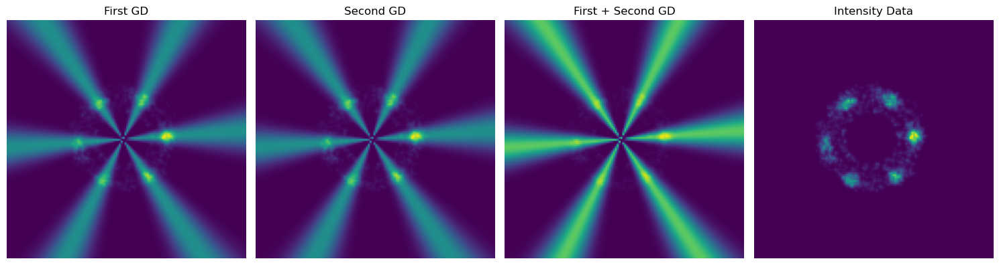

------------------------
Number of domains =  1 , Offset values are approx.  [2907.9726241134404]
0.0
110 s
offset 1: 49.693424224853516
offset 2: 49.693424224853516
tensor(-0.0575, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0575, dtype=torch.float64, grad_fn=<NegBackward0>)


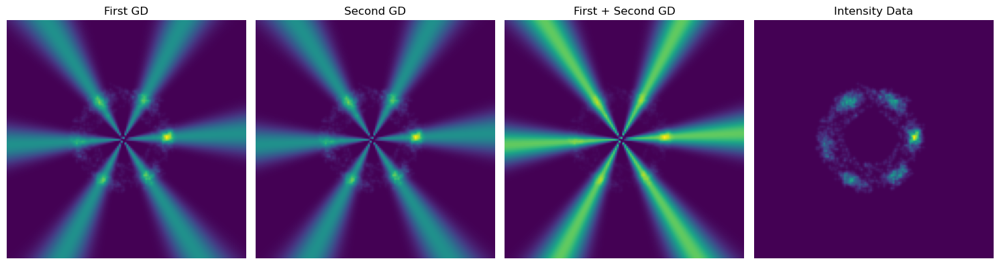

------------------------
Number of domains =  2 , Offset values are approx.  [2899.2234776372784, 2921.223477637281]
0.014326376844396277
120 s
offset 1: 49.58859634399414
offset 2: 2920.1762800860847
tensor(-0.0505, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0362, dtype=torch.float64, grad_fn=<NegBackward0>)


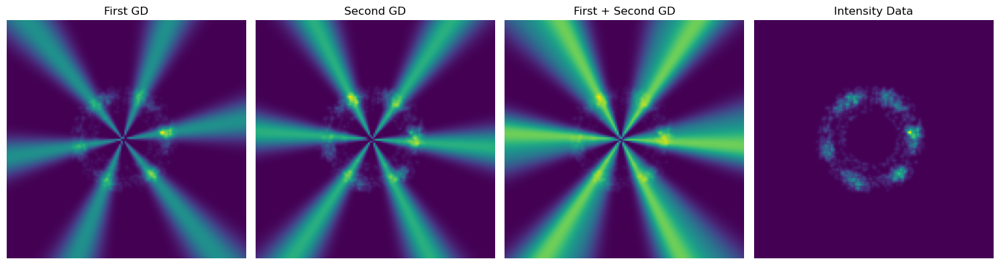

------------------------
Number of domains =  2 , Offset values are approx.  [2903.217282488737, 2868.217282488732]
0.00022638428889983075
130 s
offset 1: 49.61989974975586
offset 2: 2902.1700849375407
tensor(-0.0529, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0527, dtype=torch.float64, grad_fn=<NegBackward0>)


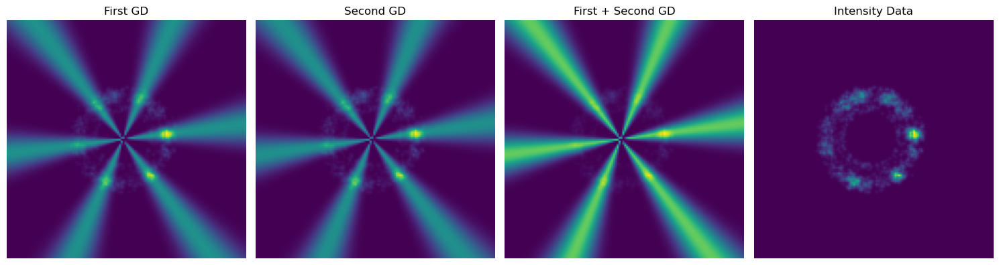

------------------------
Number of domains =  2 , Offset values are approx.  [2906.010835523269, 2879.0108355232655]
0.028246823063229023
140 s
offset 1: 49.671600341796875
offset 2: 2904.963637972073
tensor(-0.0565, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0282, dtype=torch.float64, grad_fn=<NegBackward0>)


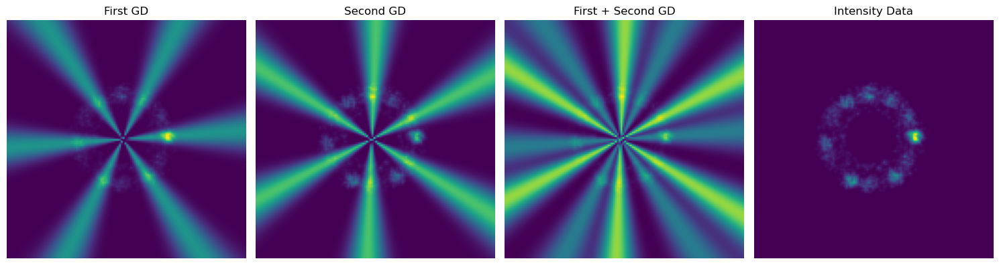

------------------------
Number of domains =  2 , Offset values are approx.  [2910.9730612455473, 2884.9730612455437]
0.04386102028473039
150 s
offset 1: 49.73133087158203
offset 2: 2909.925863694351
tensor(-0.0596, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0158, dtype=torch.float64, grad_fn=<NegBackward0>)


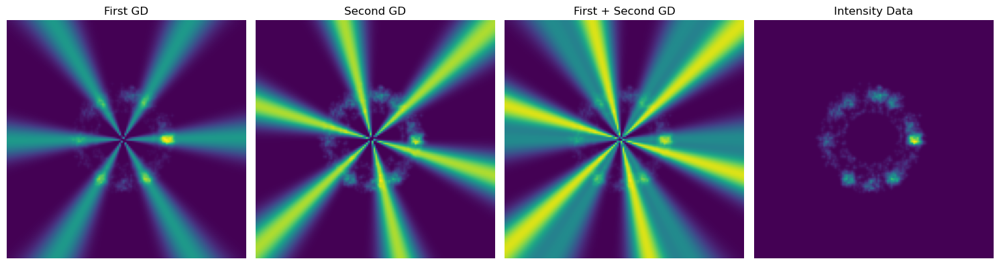

------------------------
Number of domains =  2 , Offset values are approx.  [2912.395368510317, 2878.3953685103124]
0.04098315229273359
160 s
offset 1: 49.75904083251953
offset 2: 2911.3481709591206
tensor(-0.0600, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0190, dtype=torch.float64, grad_fn=<NegBackward0>)


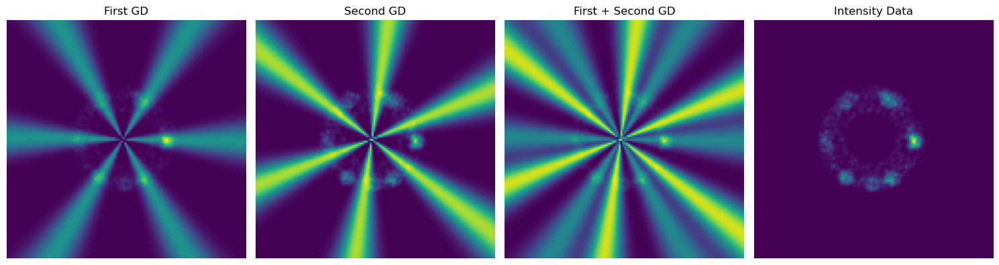

------------------------
Number of domains =  1 , Offset values are approx.  [2913.9830323225083]
0.0
170 s
offset 1: 49.81072235107422
offset 2: 49.81072235107422
tensor(-0.0529, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0529, dtype=torch.float64, grad_fn=<NegBackward0>)


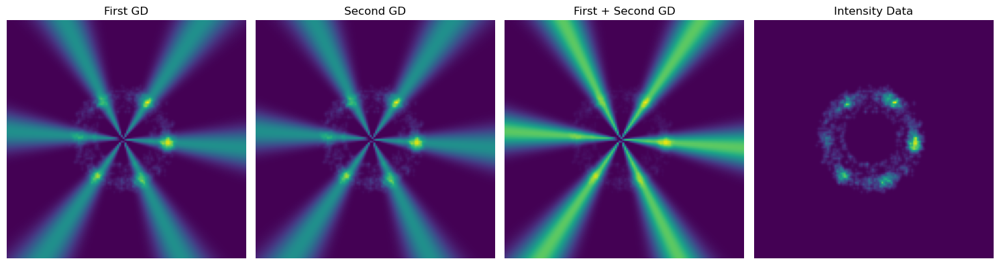

------------------------
Number of domains =  2 , Offset values are approx.  [2921.9441652145197, 2896.944165214516]
0.028735509522158014
180 s
offset 1: 49.93617248535156
offset 2: 2920.8969676633233
tensor(-0.0511, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0224, dtype=torch.float64, grad_fn=<NegBackward0>)


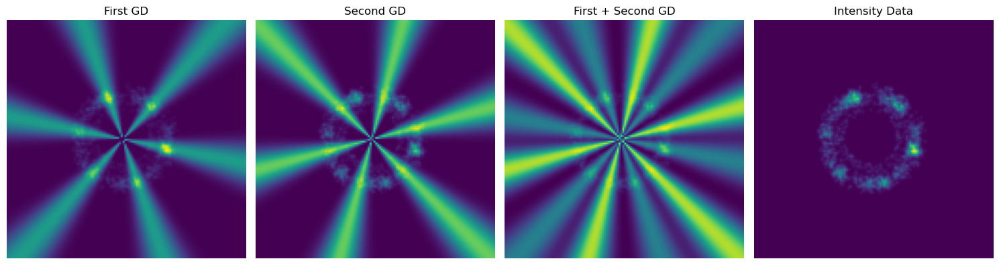

------------------------
Number of domains =  2 , Offset values are approx.  [2929.131928447961, 2899.1319284479564]
0.029509471023885833
190 s
offset 1: 50.068260192871094
offset 2: 2928.0847308967645
tensor(-0.0512, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0217, dtype=torch.float64, grad_fn=<NegBackward0>)


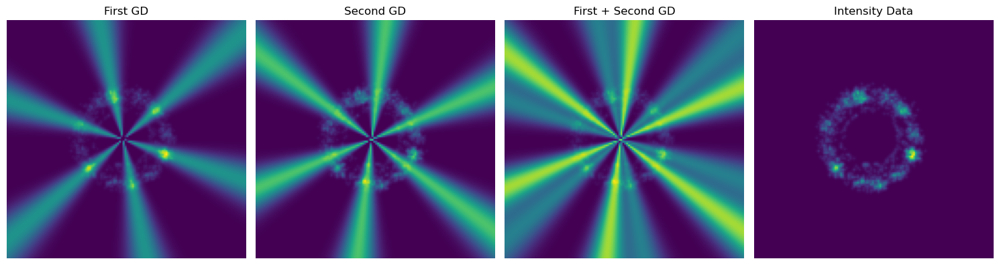

------------------------
Number of domains =  2 , Offset values are approx.  [2933.699996614388, 2901.6999966143835]
0.020630631059703183
200 s
offset 1: 50.1638298034668
offset 2: 2932.6527990631917
tensor(-0.0455, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0249, dtype=torch.float64, grad_fn=<NegBackward0>)


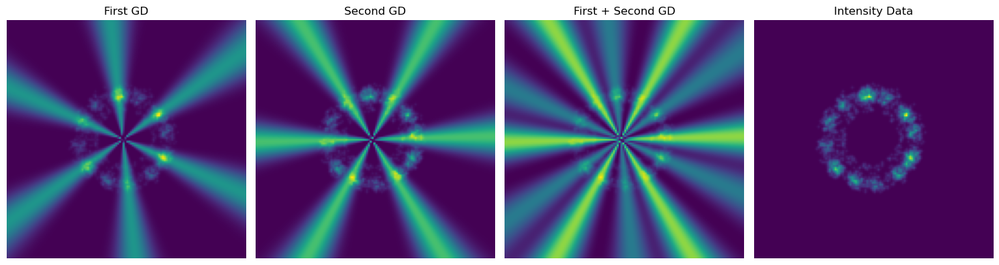

------------------------
Number of domains =  2 , Offset values are approx.  [2902.1757319512253, 2930.1757319512294]
0.004660216729447206
210 s
offset 1: 50.57999038696289
offset 2: 2929.128534400033
tensor(-0.0432, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0386, dtype=torch.float64, grad_fn=<NegBackward0>)


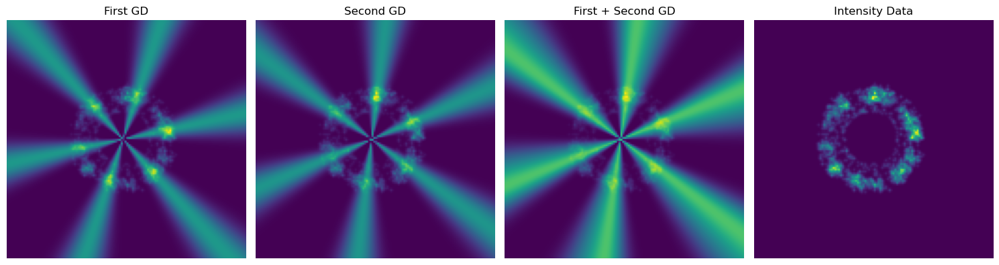

------------------------
Number of domains =  2 , Offset values are approx.  [2962.0199769852584, 2935.0199769852543]
0.017149156374854542
220 s
offset 1: 50.64449691772461
offset 2: 2960.972779434062
tensor(-0.0516, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0345, dtype=torch.float64, grad_fn=<NegBackward0>)


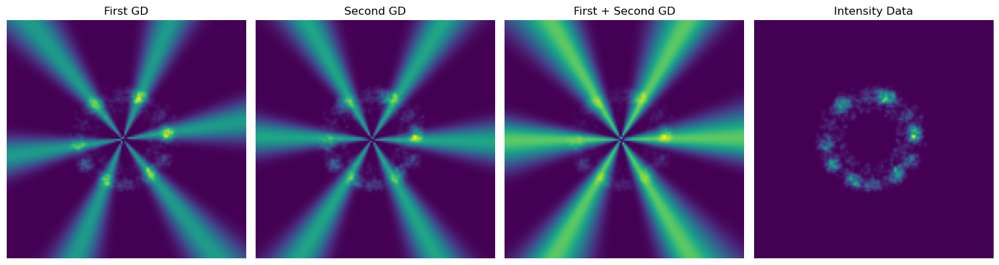

------------------------
Number of domains =  2 , Offset values are approx.  [2965.7159289489355, 2940.715928948932]
0.022672125159228312
230 s
offset 1: 50.701446533203125
offset 2: 2964.668731397739
tensor(-0.0543, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0317, dtype=torch.float64, grad_fn=<NegBackward0>)


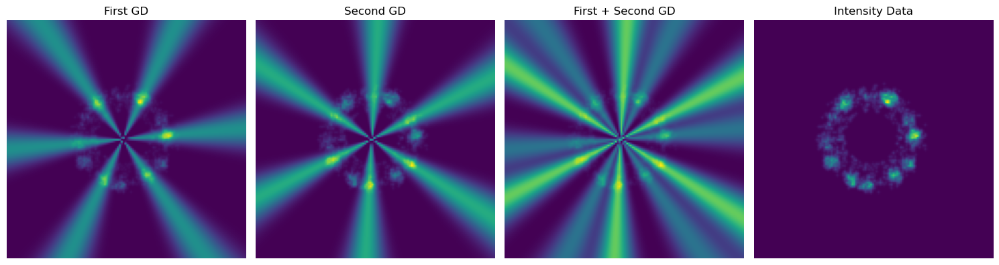

------------------------
Number of domains =  2 , Offset values are approx.  [2966.978901560747, 2944.978901560744]
0.007552635416924927
240 s
offset 1: 50.7066535949707
offset 2: 2965.9317040095507
tensor(-0.0458, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0383, dtype=torch.float64, grad_fn=<NegBackward0>)


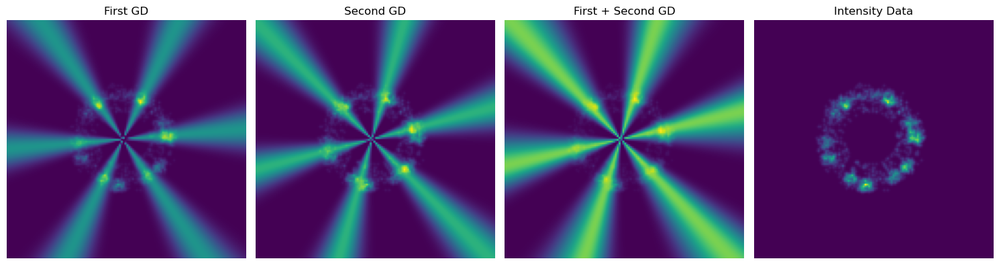

------------------------
Number of domains =  2 , Offset values are approx.  [2969.2772442236937, 2947.2772442236906]
0.0005373533260628061
250 s
offset 1: 50.723751068115234
offset 2: 2968.2300466724973
tensor(-0.2535, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.2529, dtype=torch.float64, grad_fn=<NegBackward0>)


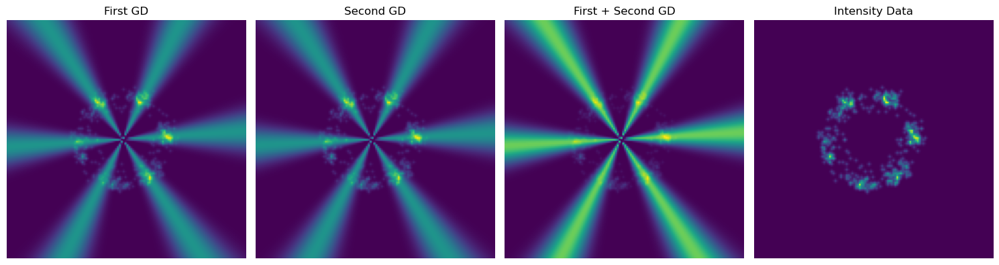

------------------------
Number of domains =  1 , Offset values are approx.  [2962.2568572752125]
0.0
260 s
offset 1: 50.66593551635742
offset 2: 50.66593551635742
tensor(-0.0772, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0772, dtype=torch.float64, grad_fn=<NegBackward0>)


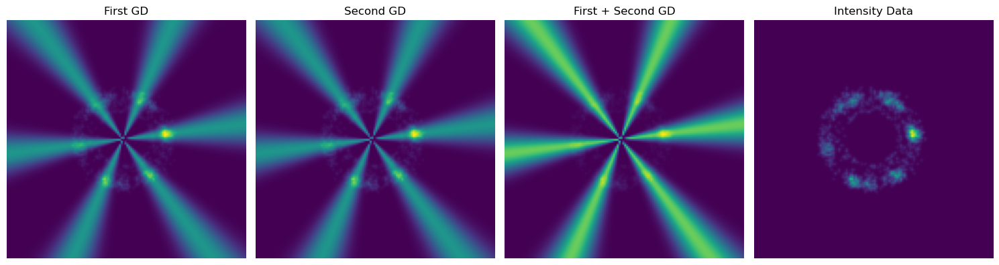

------------------------
Number of domains =  2 , Offset values are approx.  [2965.9442701692706, 2935.9442701692665]
0.026611688232919664
270 s
offset 1: 50.725135803222656
offset 2: 2964.897072618074
tensor(-0.0610, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0344, dtype=torch.float64, grad_fn=<NegBackward0>)


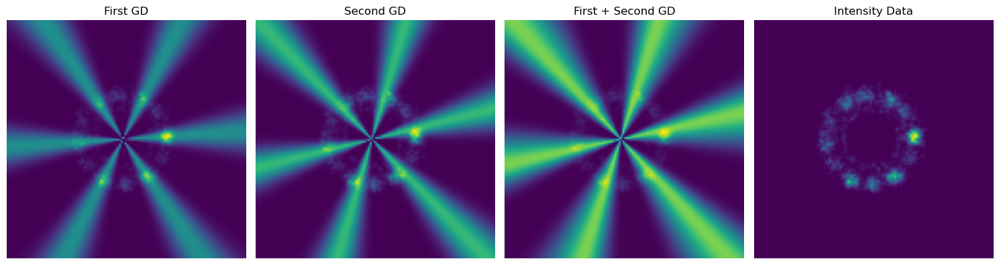

------------------------
Number of domains =  2 , Offset values are approx.  [2970.3361967526125, 2940.336196752608]
0.0004722558538481844
280 s
offset 1: 50.77690505981445
offset 2: 2969.288999201416
tensor(-0.0507, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0502, dtype=torch.float64, grad_fn=<NegBackward0>)


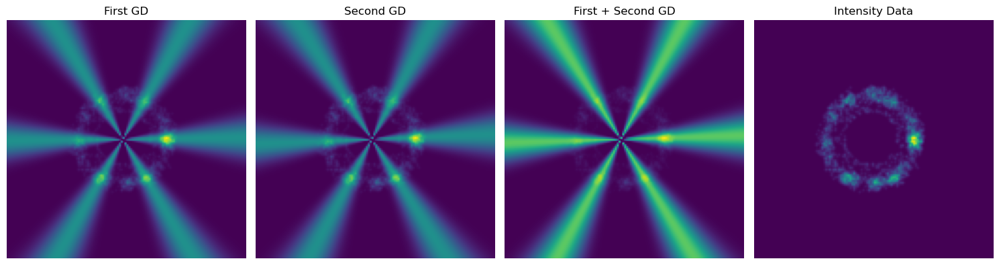

------------------------
Number of domains =  1 , Offset values are approx.  [2964.302356663851]
0.0
290 s
offset 1: 50.73841094970703
offset 2: 50.73841094970703
tensor(-0.0531, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0531, dtype=torch.float64, grad_fn=<NegBackward0>)


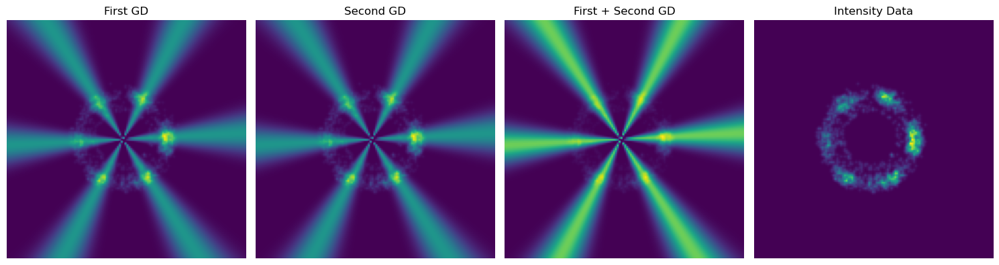

------------------------
Number of domains =  2 , Offset values are approx.  [2978.096806618586, 2964.096806618584]
0.026771405748839266
300 s
offset 1: 50.89186477661133
offset 2: 2977.0496090673896
tensor(-0.0502, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0235, dtype=torch.float64, grad_fn=<NegBackward0>)


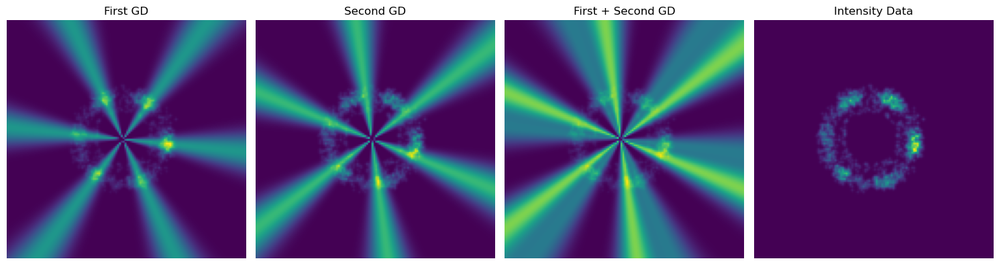

------------------------
Number of domains =  2 , Offset values are approx.  [2963.88906325033, 2982.8890632503326]
0.0009936371763266602
310 s
offset 1: 50.91004943847656
offset 2: 2981.841865699136
tensor(-0.0418, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0408, dtype=torch.float64, grad_fn=<NegBackward0>)


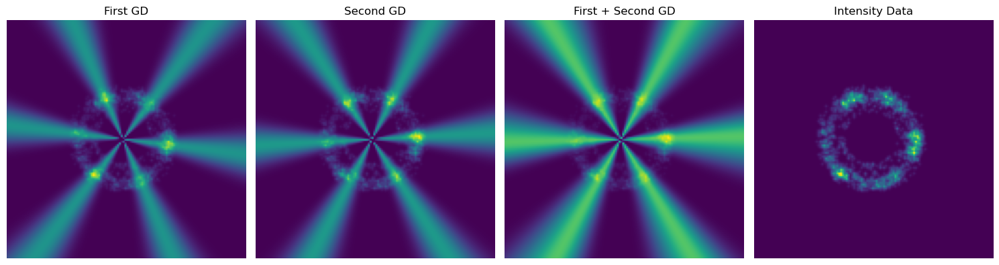

------------------------
Number of domains =  2 , Offset values are approx.  [2969.930967627081, 2936.9309676270764]
0.01779425667239429
320 s
offset 1: 50.80813217163086
offset 2: 2968.8837700758845
tensor(-0.0439, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0261, dtype=torch.float64, grad_fn=<NegBackward0>)


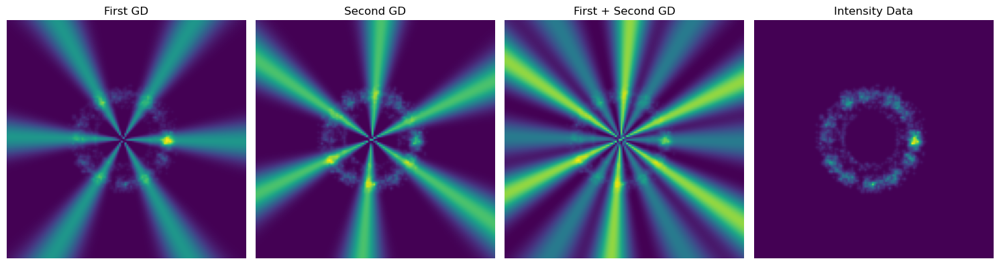

------------------------
Number of domains =  2 , Offset values are approx.  [2973.091538377315, 2941.0915383773104]
0.0017238677486530463
330 s
offset 1: 50.833824157714844
offset 2: 2972.0443408261185
tensor(-0.0370, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0352, dtype=torch.float64, grad_fn=<NegBackward0>)


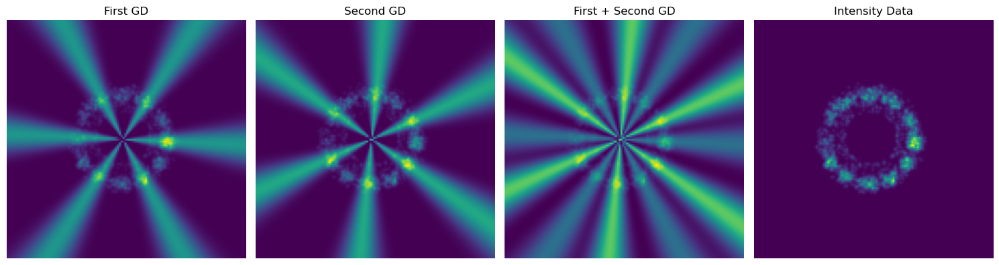

------------------------
Number of domains =  2 , Offset values are approx.  [2950.5635807472327, 2978.5635807472368]
0.0025796820214687363
340 s
offset 1: 50.931705474853516
offset 2: 2977.5163831960404
tensor(-0.0357, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0331, dtype=torch.float64, grad_fn=<NegBackward0>)


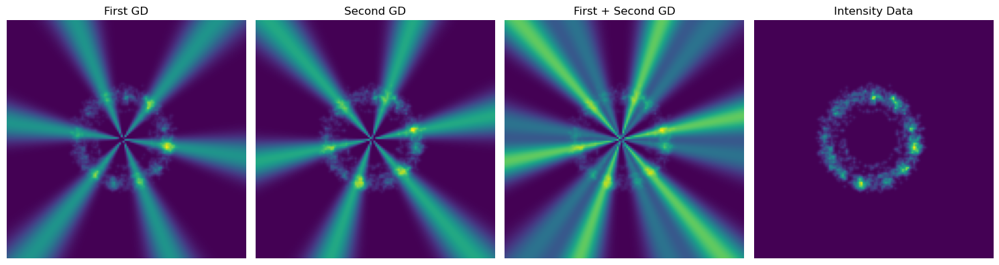

------------------------
Number of domains =  2 , Offset values are approx.  [2958.1717671124607, 2987.1717671124647]
0.0029568136932447107
350 s
offset 1: 51.0822639465332
offset 2: 2986.1245695612683
tensor(-0.0276, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0246, dtype=torch.float64, grad_fn=<NegBackward0>)


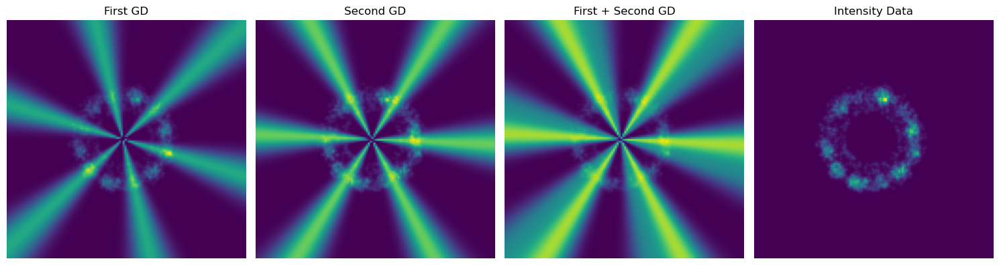

------------------------
Number of domains =  2 , Offset values are approx.  [2957.7981321096454, 2987.7981321096495]
0.0014325488713528498
360 s
offset 1: 51.07366943359375
offset 2: 2986.750934558453
tensor(-0.0298, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0312, dtype=torch.float64, grad_fn=<NegBackward0>)


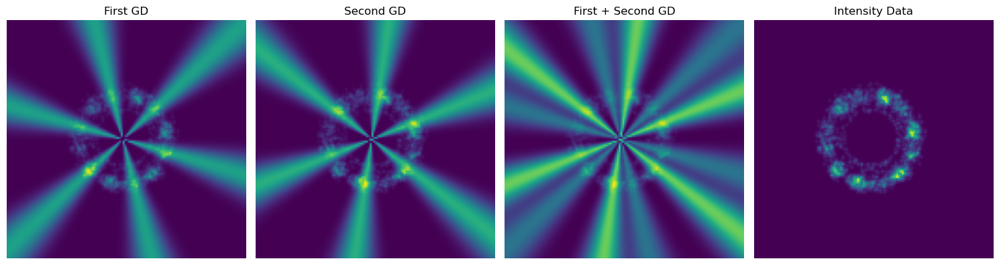

------------------------
Number of domains =  2 , Offset values are approx.  [2960.3057027912446, 2992.305702791249]
0.010677799842527355
370 s
offset 1: 51.220115661621094
offset 2: 2991.2585052400527
tensor(-0.0294, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0400, dtype=torch.float64, grad_fn=<NegBackward0>)


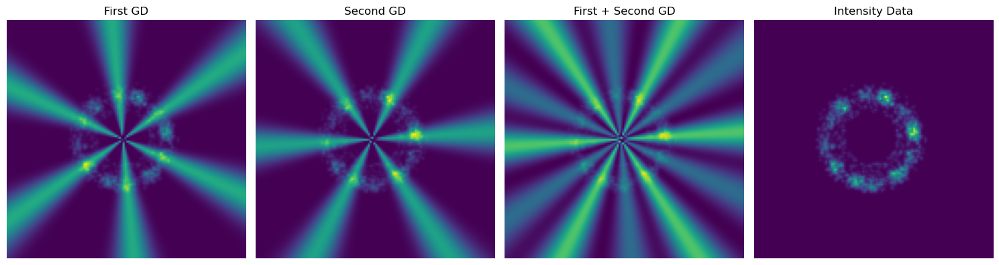

------------------------
Number of domains =  2 , Offset values are approx.  [2958.69645358282, 2993.696453582825]
0.035933013705480035
380 s
offset 1: 51.65031433105469
offset 2: 2992.6492560316287
tensor(-0.0529, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0170, dtype=torch.float64, grad_fn=<NegBackward0>)


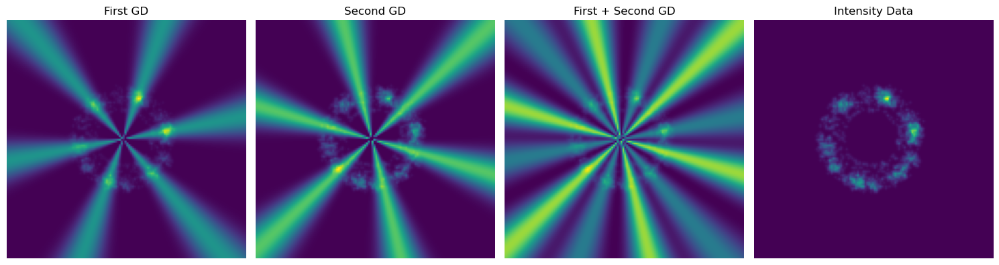

------------------------
Number of domains =  2 , Offset values are approx.  [3021.3450216935144, 2999.345021693511]
0.006742611627334
390 s
offset 1: 51.6907958984375
offset 2: 3020.297824142318
tensor(-0.0406, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0338, dtype=torch.float64, grad_fn=<NegBackward0>)


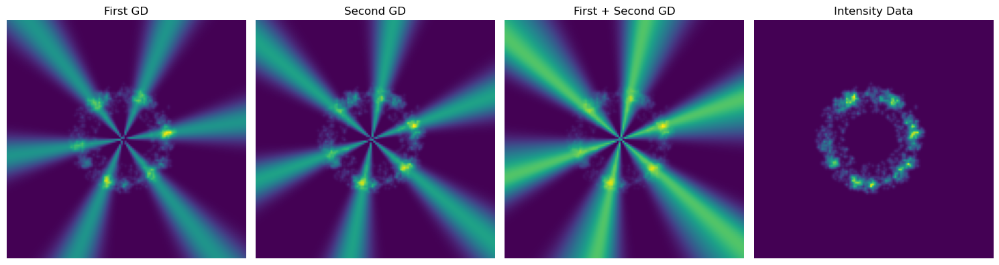

------------------------
Number of domains =  2 , Offset values are approx.  [3022.664444652624, 3004.664444652621]
0.0033778488791436356
400 s
offset 1: 51.63995361328125
offset 2: 3021.6172471014274
tensor(-0.0415, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0381, dtype=torch.float64, grad_fn=<NegBackward0>)


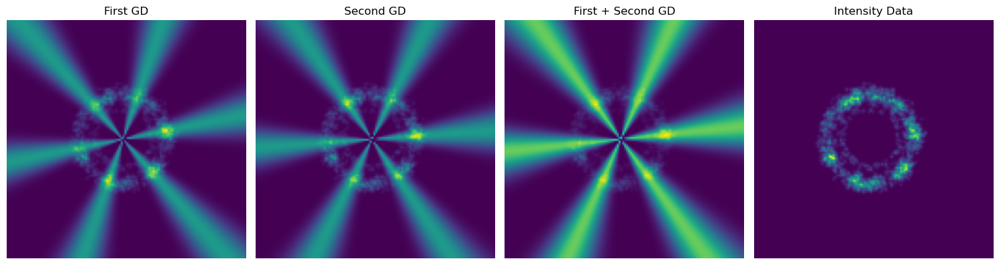

------------------------
Number of domains =  2 , Offset values are approx.  [3022.7513962923704, 2991.751396292366]
0.01557570003919928
410 s
offset 1: 51.64392852783203
offset 2: 3021.704198741174
tensor(-0.0463, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0307, dtype=torch.float64, grad_fn=<NegBackward0>)


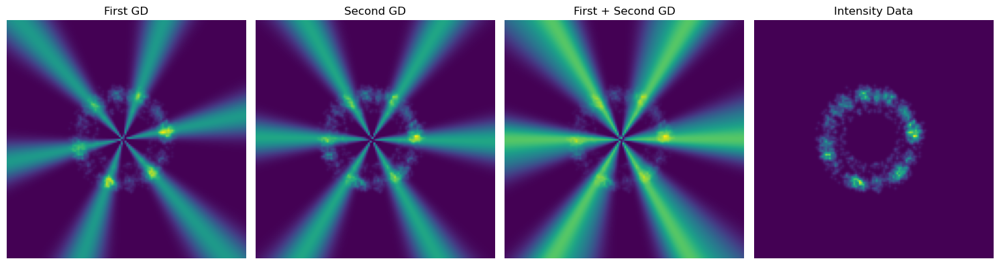

------------------------
Number of domains =  1 , Offset values are approx.  [3019.979142120055]
0.0
420 s
offset 1: 51.65165328979492
offset 2: 51.65165328979492
tensor(-0.0544, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0544, dtype=torch.float64, grad_fn=<NegBackward0>)


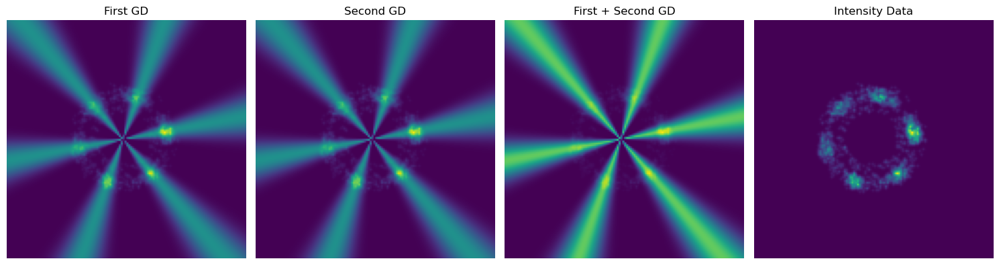

------------------------
Number of domains =  1 , Offset values are approx.  [3025.4217383782725]
0.0
430 s
offset 1: 51.749385833740234
offset 2: 51.749385833740234
tensor(-0.0689, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0689, dtype=torch.float64, grad_fn=<NegBackward0>)


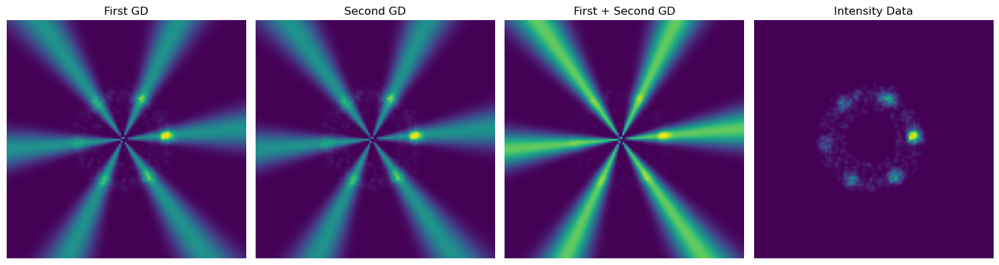

------------------------
Number of domains =  2 , Offset values are approx.  [3030.0214006674155, 2998.021400667411]
0.0019208940578928357
440 s
offset 1: 51.829689025878906
offset 2: 3028.974203116219
tensor(-0.0696, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0677, dtype=torch.float64, grad_fn=<NegBackward0>)


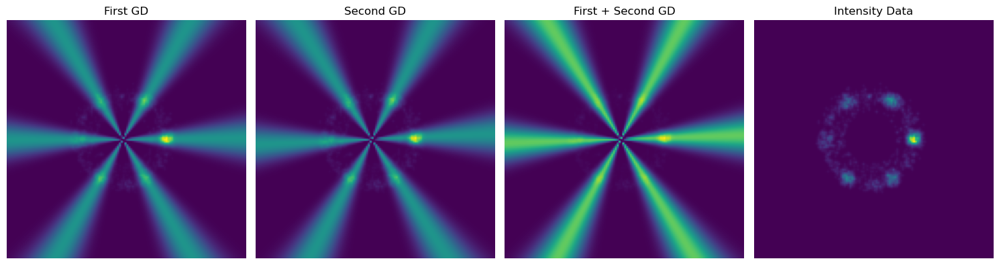

------------------------
Number of domains =  1 , Offset values are approx.  [3033.6224346583895]
0.0
450 s
offset 1: 51.89181900024414
offset 2: 51.89181900024414
tensor(-0.0674, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0674, dtype=torch.float64, grad_fn=<NegBackward0>)


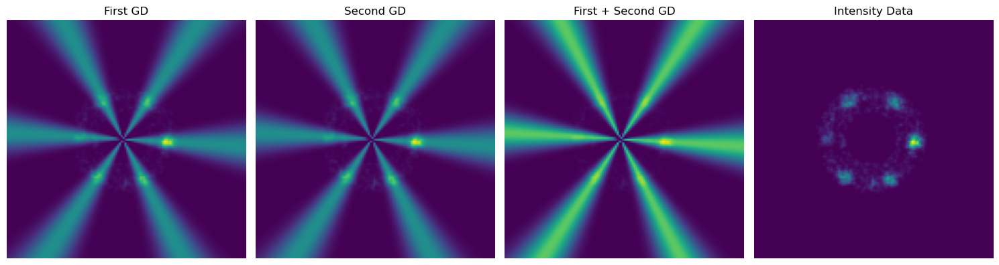

------------------------
Number of domains =  1 , Offset values are approx.  [3036.182219970773]
0.0
460 s
offset 1: 51.94902801513672
offset 2: 51.94902801513672
tensor(-0.0621, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0621, dtype=torch.float64, grad_fn=<NegBackward0>)


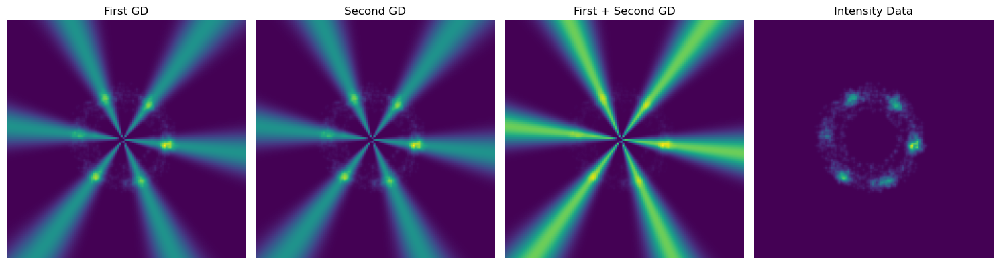

------------------------
Number of domains =  1 , Offset values are approx.  [3042.4600550742193]
0.0
470 s
offset 1: 52.05293273925781
offset 2: 52.05293273925781
tensor(-0.0567, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0567, dtype=torch.float64, grad_fn=<NegBackward0>)


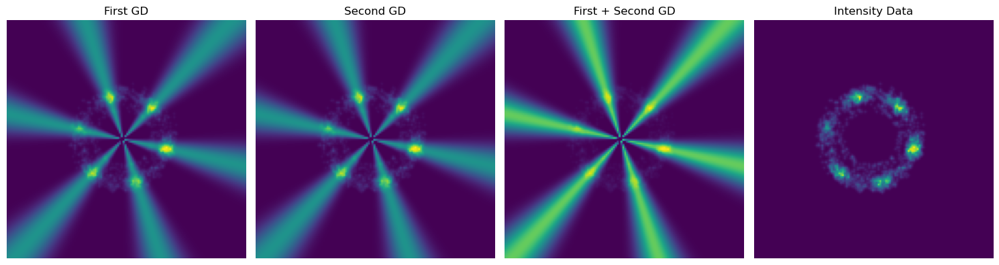

------------------------
Number of domains =  1 , Offset values are approx.  [3046.413357237829]
0.0
480 s
offset 1: 52.19565963745117
offset 2: 52.19565963745117
tensor(-0.0483, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0483, dtype=torch.float64, grad_fn=<NegBackward0>)


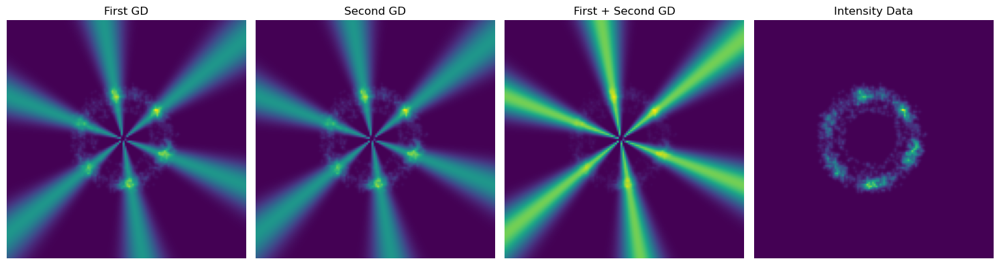

------------------------
Number of domains =  2 , Offset values are approx.  [3005.591006127295, 3065.5910061273034]
0.03979220170425734
490 s
offset 1: 52.446285247802734
offset 2: 3064.543808576107
tensor(-0.0551, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0153, dtype=torch.float64, grad_fn=<NegBackward0>)


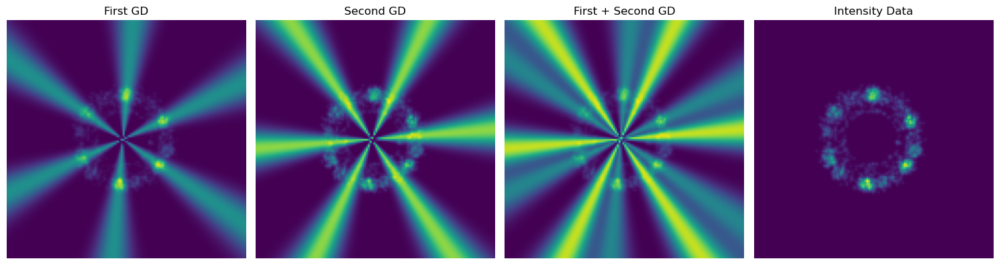

------------------------
Number of domains =  2 , Offset values are approx.  [3070.950795838337, 3041.950795838333]
0.04132422619485576
500 s
offset 1: 52.542057037353516
offset 2: 3069.9035982871405
tensor(-0.0598, dtype=torch.float64, grad_fn=<NegBackward0>) tensor(-0.0185, dtype=torch.float64, grad_fn=<NegBackward0>)


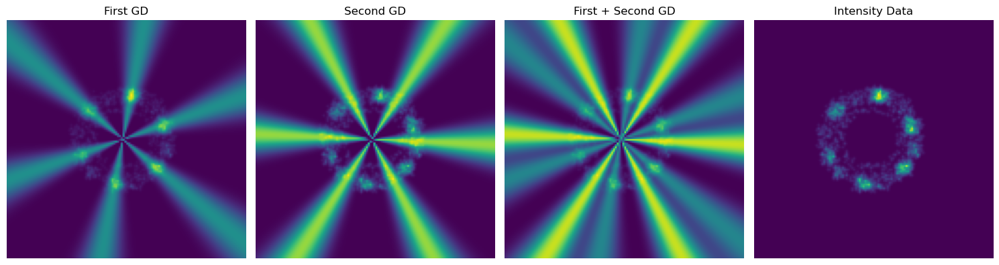

------------------------


In [55]:
###### Apply function
offset_list1 = []
offset_list2 = []
single_domain_loss_list = []
single_domain_index_list = []
two_domain_loss_list = []
two_domain_index_list = []
frame_ranges = np.arange(0, 50, 1)
for i in frame_ranges:
    first, first_image, first_loss, second, second_image, second_loss = gradient_descent_optimize_offset(intensity_data[i] / mon_5[i], offset1, offset2)
    print(np.abs(second_loss.item() - first_loss.item()))
    # condition to store loss depending on if 1 or 2 peaks are detected
    if np.abs(second_loss.item() - first_loss.item()) == 0:
        single_domain_loss_list.append(first_loss.item())
        single_domain_index_list.append(i)

    else:
        two_domain_loss_list.append((first_loss.item(), second_loss.item()))
        two_domain_index_list.append(i)

    print((i+1)*10, "s")
    print('offset 1:', first.item())
    print('offset 2:', second.item())
    print(first_loss, second_loss)
    offset_list1.append(np.rad2deg(first.item()))
    offset_list2.append(np.rad2deg(second.item()))
    
    # PLOTTING
    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    axes[0].imshow(first_image.detach().T + normalize_min_max(intensity_data[i]).T, origin='lower')
    axes[0].set_title('First GD')
    axes[0].axis('off')
    axes[1].imshow(second_image.detach().T + normalize_min_max(intensity_data[i]).T, origin='lower')
    axes[1].set_title('Second GD')
    axes[1].axis('off')
    axes[2].imshow(first_image.detach().T + second_image.detach().T *2 + normalize_min_max(intensity_data[i]).T, origin='lower')
    axes[2].set_title('First + Second GD')
    axes[2].axis('off')
    axes[3].imshow(intensity_data[i].T, origin='lower')
    axes[3].set_title('Intensity Data')
    axes[3].axis('off')
    plt.tight_layout()
    plt.show()

    print('------------------------')


[-0.06635289546622242, -0.05777656700227663, -0.05678334261396488, -0.05637639135669076, -0.06630045239451886, -0.07630960508163367, -0.06953852549960265, -0.06822306823951287, -0.06631519004988155, -0.05754831456149295, -0.05286924990948447, -0.07716703971690203, -0.05308477154218759, -0.05435488514724654, -0.06888094484206451, -0.06742152665267698, -0.062102440949786196, -0.056700528495450236, -0.04833197771229224]
[-0.0636270913482083, -0.0505329645266264, -0.05288349118115945, -0.05647701453209637, -0.05964092912314595, -0.05999546063927134, -0.05111387353210608, -0.05117217792386812, -0.0455403848303192, -0.04322253987707599, -0.051605334999544075, -0.0543449881606316, -0.04584033454231477, -0.25346104943581255, -0.06098337635311022, -0.050675418855799396, -0.05022877060550961, -0.0418081921449496, -0.043865756344456275, -0.036958272848970346, -0.0357042177261296, -0.02755148075140995, -0.02977546489946198, -0.02935232976483644, -0.052934743479513637, -0.04058426888405495, -0.0414

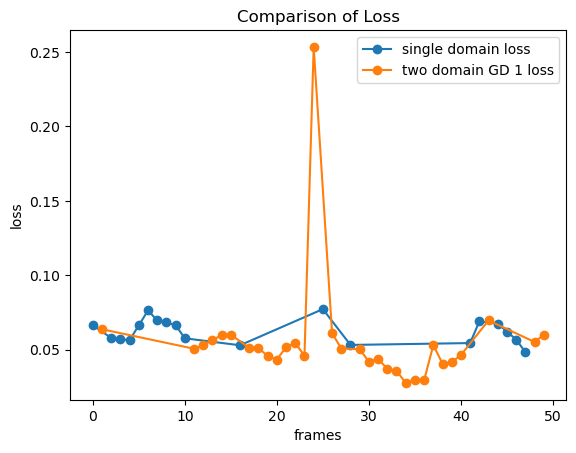

In [54]:
plt.plot(single_domain_index_list, np.abs(single_domain_loss_list), label = "single domain loss", marker='o')
print(single_domain_loss_list)
two_domain_loss = [t[0] for t in two_domain_loss_list]
print(two_domain_loss)
plt.plot(two_domain_index_list, np.abs(two_domain_loss), label='two domain GD 1 loss', marker='o')
plt.ylabel('loss')
plt.xlabel('frames')
# plt.ylim(0,.1)
plt.title('Comparison of Loss')
plt.legend()

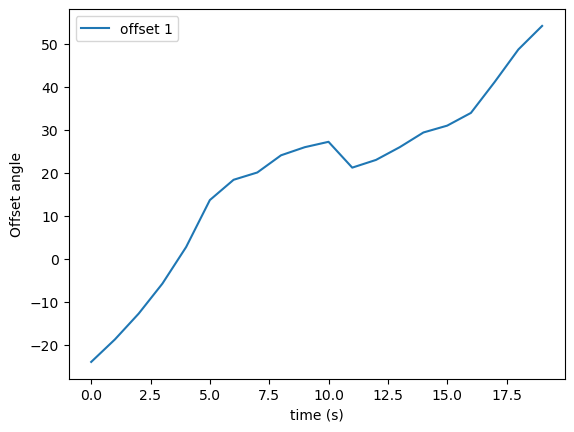

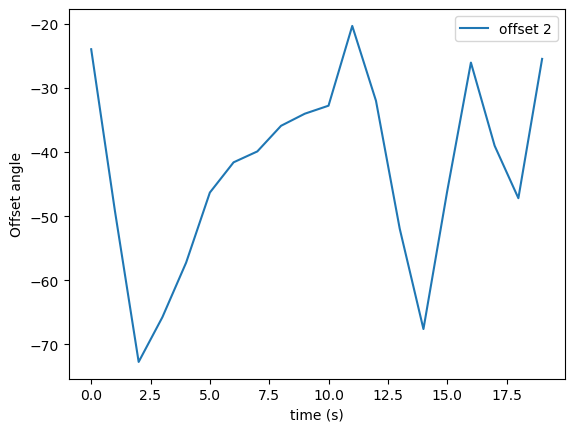

In [ ]:
# previous plot to compare
plt.plot(frame_ranges, np.array(offset_list1), label = 'offset 1')
plt.xlabel('time (s)')
plt.ylabel('Offset angle')
plt.legend()
plt.show()
offset_list2_fix = adjust_offset_within_bounds(offset_list2, 27)
plt.plot(frame_ranges, np.array(offset_list2_fix), label = 'offset 2')
plt.xlabel('time (s)')
plt.ylabel('Offset angle')
plt.legend()
plt.show()